# Decision Trees
Determining the survival chance on the Titanic using a Decision Tree model.

## Data analysis and preprocessing
We will load and anaylise the data, remove or fix null values, and remove the features we won't be needing.

In [2]:
# importing libraries
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
# 
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier, export_graphviz, DecisionTreeRegressor, plot_tree
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
# using metrics module for MSE, MAE, and R2 score
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, explained_variance_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay

In [3]:
# Loading the dataset
titanic_df = pd.read_csv("titanic.csv")
titanic_df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [4]:
titanic_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


The *'Cabin'* feature has a lot of missing data and the values are not giving us much information, same for *'Ticket'*, so we will remove both features. As for *'Fare'*, it is linked to the Passenger class (3rd class passengers had cheaper ticket fares than 2nd and 1st classes). Because it is directly correlated to the Passenger class (*'Pclass'*), we will remove *'Fare'* as well.<br>

We will also remove *'Name'* and *'PassengerId'* because we don't need to identify each passenger in our model and the index value of each passenger has no effect on predicting their survival or not.

In [5]:
# Dropping columns 
titanic_df.drop(['Cabin', 'Ticket', 'PassengerId', 'Name', 'Fare'], axis=1, inplace=True)
titanic_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Survived  891 non-null    int64  
 1   Pclass    891 non-null    int64  
 2   Sex       891 non-null    object 
 3   Age       714 non-null    float64
 4   SibSp     891 non-null    int64  
 5   Parch     891 non-null    int64  
 6   Embarked  889 non-null    object 
dtypes: float64(1), int64(4), object(2)
memory usage: 48.9+ KB


We have some missing data, which we need to fix prior to creating our Decision tree model. *'Embark'* only has 2 missing values, so we will remove them, but *'Age'* is missing 177 values, so we will replace them with the mean value.

In [6]:
# Calculating Age's mean value
age_mean = titanic_df['Age'].mean()

# Replace Age's nan values with the mean value
titanic_df['Age'] = titanic_df['Age'].replace(np.nan, age_mean)

# Removing the missing values from 'Embark'
titanic_df = titanic_df.dropna()

# Checking 'Age' and 'Embark' have no more missing values
titanic_df.isnull().sum()

Survived    0
Pclass      0
Sex         0
Age         0
SibSp       0
Parch       0
Embarked    0
dtype: int64

### One-Hot Encoding
One-hot encoding is a technique used to ensure that categorical variables are better represented in the machine. Let's take a look at the "Sex" column

In [7]:
titanic_df["Sex"].unique()

array(['male', 'female'], dtype=object)

Machine Learning classifiers don't know how to handle strings. As a result, you need to convert it into a categorical representation. There are two main ways to go about this:

Label Encoding: Assigning, for example, 0 for "male" and 1 for "female". The problem here is it intrinsically makes one category "larger than" the other category.

One-hot encoding: Assigning, for example, [1, 0] for "male" and [0, 1] for female. In this case, you have an array of size (n_categories,) and you represent a 1 in the correct index, and 0 elsewhere. In Pandas, this would show as extra columns. For example, rather than having a "Sex" column, it would be a "Sex_male" and "Sex_female" column. Then, if the person is male, it would simply show as a 1 in the "Sex_male" column and a 0 in the "Sex_female" column.

There is a nice and easy method that does this in pandas: get_dummies()

In [8]:
titanic_df = pd.get_dummies(titanic_df, prefix="Sex", columns=["Sex"], dtype='int')
titanic_df.head()

,Survived,Pclass,Age,SibSp,Parch,Embarked,Sex_female,Sex_male
0,0,3,22.0,1,0,S,0,1
1,1,1,38.0,1,0,C,1,0
2,1,3,26.0,0,0,S,1,0
3,1,1,35.0,1,0,S,1,0
4,0,3,35.0,0,0,S,0,1


Now, we do the same to the "Embarked" column.

In [9]:
titanic_df = pd.get_dummies(titanic_df, prefix="Embarked", columns=["Embarked"], dtype='int')
titanic_df.head()

,Survived,Pclass,Age,SibSp,Parch,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
0,0,3,22.0,1,0,0,1,0,0,1
1,1,1,38.0,1,0,1,0,1,0,0
2,1,3,26.0,0,0,1,0,0,0,1
3,1,1,35.0,1,0,1,0,0,0,1
4,0,3,35.0,0,0,0,1,0,0,1


In [10]:
# Checking if there are any more changes needed (nul values or object data types)
titanic_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 889 entries, 0 to 890
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Survived    889 non-null    int64  
 1   Pclass      889 non-null    int64  
 2   Age         889 non-null    float64
 3   SibSp       889 non-null    int64  
 4   Parch       889 non-null    int64  
 5   Sex_female  889 non-null    int32  
 6   Sex_male    889 non-null    int32  
 7   Embarked_C  889 non-null    int32  
 8   Embarked_Q  889 non-null    int32  
 9   Embarked_S  889 non-null    int32  
dtypes: float64(1), int32(5), int64(4)
memory usage: 59.0 KB


Now that all the variables are integers or floats, we can proceed.<br>
*'Survived'* will be our **dependent/y-variable** and all the remaining features will be our **independent/x-variables**.

## Train, Development, and Test Samples
We create our training and test sets comprising 70% and 30% of the data respectively, but we will also split the Train set into two subsets, 'Train' and 'Development' using the same ratio, so that we can test different tree depths before applying the model with the best depth to our Test set. 

In [11]:
# Creating the X and y variables for our model
X = titanic_df.drop('Survived', axis=1)
y = titanic_df['Survived']

#random state
r = 42

# Splitting the original dataset into training and test sets 
X_train_full, X_test, y_train_full, y_test = train_test_split(X,y, test_size=0.3, random_state=r)

# Splitting the training set further into training and development sets
X_train, X_dev, y_train, y_dev = train_test_split(X_train_full, y_train_full, test_size=0.3, random_state=r)

In [12]:
# Inspecting the Datasets:
print ("Training data:",X_train.shape, y_train.shape)
print ("Development data:",X_dev.shape, y_dev.shape)
print ("Test data:",X_test.shape, y_test.shape)

Training data: (435, 9) (435,)
Development data: (187, 9) (187,)
Test data: (267, 9) (267,)


## Decision Tree Classifier
We create an unpruned Decision tree model on the Train subset and we test it on the Development subset first. We will then test it again on the same Development set using different depths to find the most suitable depth value.

In [13]:
# Create Decision tree Classifier object
# training a model without pruning
unpruned = DecisionTreeClassifier(random_state=r)

# Train Decision tree Classifier
unpruned.fit(X_train,y_train)

# Predict the response for the Development subset
y_train_pred = unpruned.predict(X_train)
y_dev_pred = unpruned.predict(X_dev)

Let's see what our unpruned tree looks like.

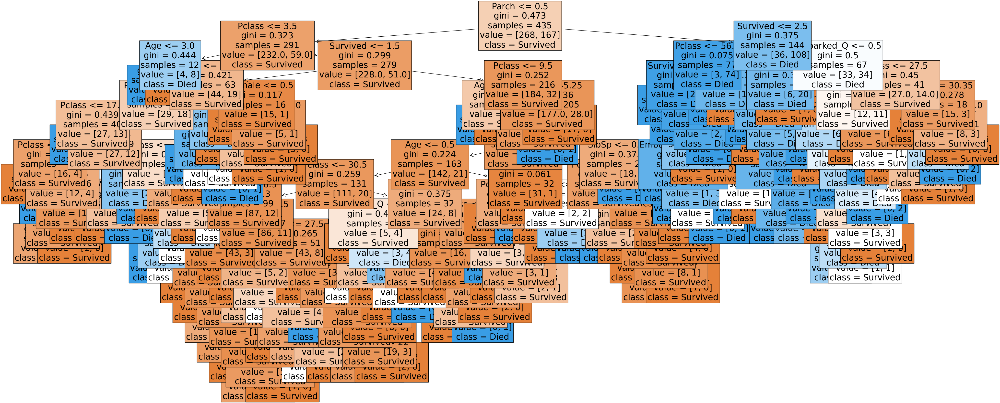

In [14]:
# Plotting the Tree
plt.figure(figsize=(50,20))
features = titanic_df.columns
classes = ['Survived', 'Died']
tree.plot_tree(unpruned, feature_names=features, class_names=classes, filled=True, fontsize=25)
plt.show()

### Model Accuracy
We want to avoid underfitting and overfitting, so let's check our training and testing sets accuracy.

In [15]:
print(f'Training accuracy: {accuracy_score(y_train,y_train_pred)}')
print(f'Development Accuracy: {accuracy_score(y_dev,y_dev_pred)}')
print('At depth: ', unpruned.tree_.max_depth)

Training accuracy: 0.9425287356321839
Development Accuracy: 0.7967914438502673
At depth:  18


A Confusion Matrix is a great visualisation tool to see how bad/well our model worked by looking at False Positive and False Negative.

Text(0.5, 1.0, 'Development Confusion Matrix')

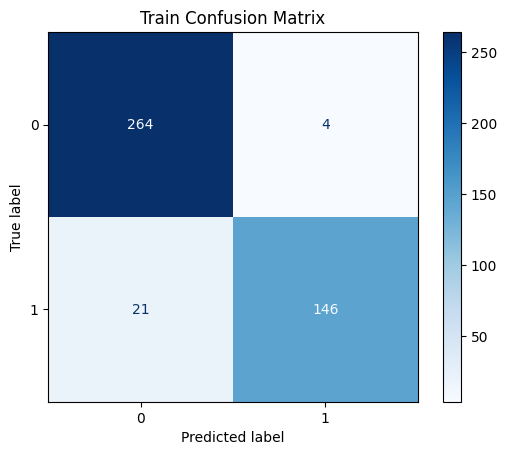

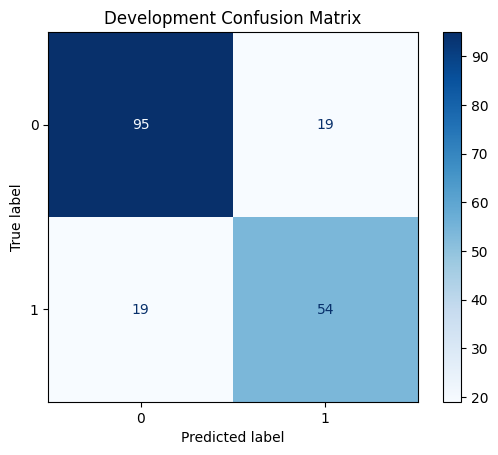

In [16]:
# Setting the parameters to display the Trainig confusion matrix
cm = confusion_matrix(y_train,y_train_pred, labels=unpruned.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=unpruned.classes_)

# display the Training Confusion matrix
disp.plot(cmap='Blues')
plt.title('Train Confusion Matrix')

# Setting the parameters to display the Development confusion matrix
cm = confusion_matrix(y_dev,y_dev_pred, labels=unpruned.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=unpruned.classes_)

# display the Development Confusion matrix
disp.plot(cmap='Blues')
plt.title('Development Confusion Matrix')

We can see on the **Training Confusion Matrix** that there are many False Negative, while on the **Development Confusion Matrix** there is an equal number of False Negative and False Positive data. We will try to minimize these values.

## Pre-pruning
To get the best model, we need to reduce the error (or increase the Accuracy). For this, we need to find the optimum max_depth value, so as to avoid underfitting or overfitting our model. We will try with different **max_depth** values, **ranging from 2 to 10** (as per instructions) and select the one that gives our model the best Accuracy.

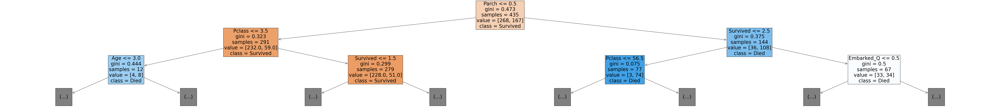

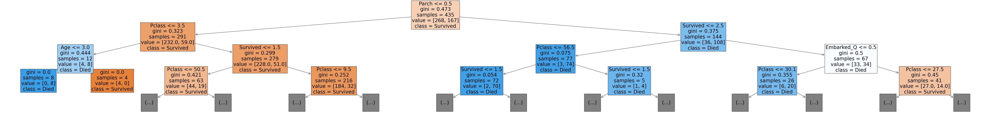

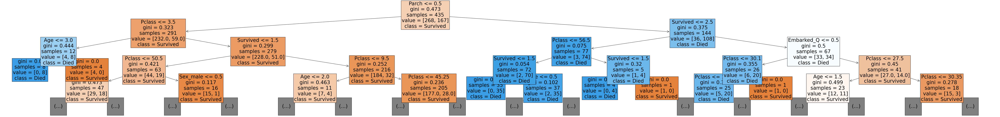

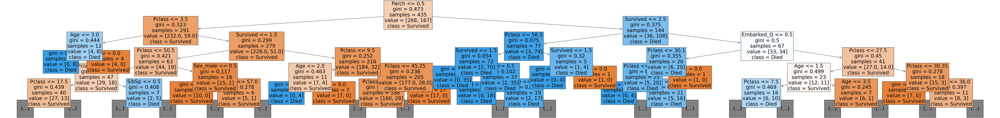

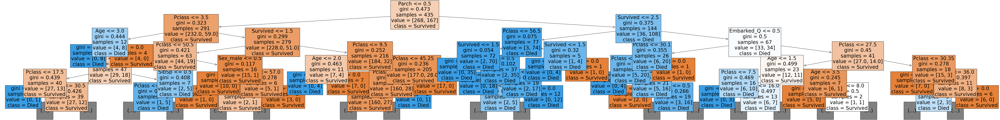

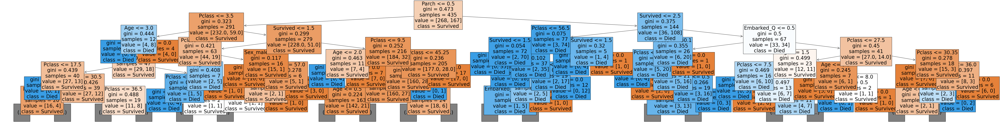

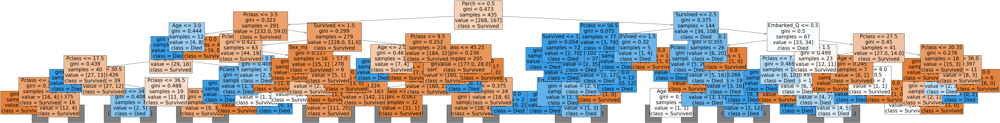

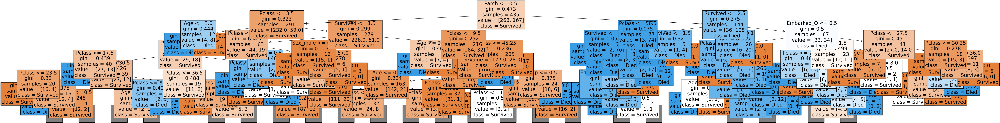

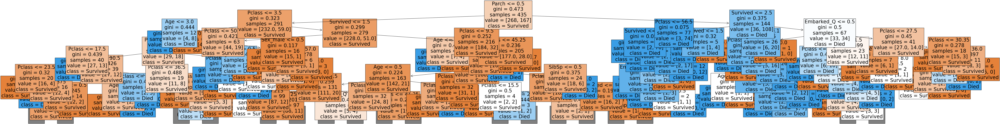

In [17]:
# Looking at effects of max_depth pruning
pruned_depth = range(2, unpruned.tree_.max_depth-7) # the depth of the unpruned tree was 18, so we remove 7 to get to 10 

# Setting a for loop[ for each depth 
train_acc_score = []
dev_acc_score = []
pruned_scores = []
for i in pruned_depth:
    clf = DecisionTreeClassifier(max_depth=i, random_state=r)
    clf.fit(X_train, y_train)
    score = clf.score(X_dev,y_dev)
    pruned_scores.append(score)
    # Updating the model with teach iteration of max_depth
    y_train_pred = clf.predict(X_train)
    y_dev_pred = clf.predict(X_dev)
    # Updating the train and development Accuracy scores and storing them in a list
    train_value = accuracy_score(y_train,y_train_pred)
    dev_value = accuracy_score(y_dev,y_dev_pred)
    train_acc_score.append(train_value)
    dev_acc_score.append(dev_value)
    # Plotting the Decision tree for each max_depth iteration
    plt.figure(figsize=(90,10))
    features = titanic_df.columns
    classes = ['Survived', 'Died']
    tree.plot_tree(unpruned, feature_names=features, class_names=classes, filled=True, fontsize=25,max_depth=i) # Show a Decision Tree for each max_deth value
    plt.show()



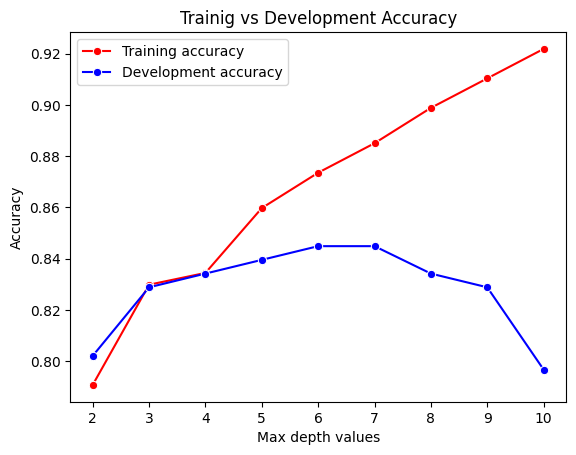

In [18]:
# Plotting the Accuracy of Train and Development sets 
sns.lineplot(x=pruned_depth, y=train_acc_score, marker="o",color='r',label="Training accuracy")
sns.lineplot(x=pruned_depth, y=dev_acc_score, marker="o",color='b',label="Development accuracy")
plt.xlabel("Max depth values")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Trainig vs Development Accuracy")
plt.show()

The **Training accuracy plot** looks almost like an upward diagonal line. As the max_depth iterations increase, the accuracy increases as well on the Train set, which is expected, however the higher the max_depth, the more we risk overfitting. Luckily, the Development data accuracy doesn't quite follow the same pattern. <br>

The **Development Accuracy plot** follows a Gaussian curve with a maximum accuracy for a max_depth around 6-7. We will select the best max_depth from the Development set because this gives us the optimum fitting (no risk of overfitting or underfitting). We will determine exactly which of these values (6 or 7) is actually the best.

Let's find the **best max_depth** value within the range (2, 10) (as per instruction), so that we can prune our Decision Tree and create our final model. 

In [19]:
# Finding the best max_depth value
best_depth = pruned_depth[np.argmax(pruned_scores)]
print('Best performance reached at depth of: ', best_depth)

Best performance reached at depth of:  6


## Fitting our model on the Test Set
We will create our pruned and final model with the max_depth of 6, and apply it to our test data.

In [21]:
# training a model with pruning
pruned = DecisionTreeClassifier(criterion="entropy",random_state=r,max_depth=best_depth,min_samples_leaf=2)

# Train Decision tree Classifier
pruned.fit(X_train,y_train)

# Predict the response for the Test subset
y_train_pred = pruned.predict(X_train)
y_test_pred = pruned.predict(X_test)
y_dev_pred = pruned.predict(X_dev)

# Showing the accuracy scores
print(f'Training accuracy: {accuracy_score(y_train,y_train_pred)}')
print(f'Development Accuracy: {accuracy_score(y_dev,y_dev_pred)}') 
print(f'Testing Accuracy: {accuracy_score(y_test,y_test_pred)}')
print('At depth: ',best_depth)

# print('Performance without pruning:', unpruned.score(X_dev, y_dev))

Training accuracy: 0.8574712643678161
Development Accuracy: 0.8288770053475936
Testing Accuracy: 0.8089887640449438
At depth:  6


Our Testing Accuracy is 80.1% and at the best max_depth (6), our Development accuracy has increased from 79.7% (at max_depth 18) to 82.9%, which is much better. On the other hand, the Train accuracy value has nearly lost 10% from max_depth 18 to max_depth at 6, however we are interested in making better predictions, so having a lower max_depth was definitly beneficial for our model's performance. <br>
This clearly illustrate that a higher Train accuracy value doesn't necessary lead to better predictions and why it is important to avoid overfitting our model. 